<img src="GDT.png" width="200" align="left"><img src="coursera.png" width="100" align="right"><font size="6.5"><h1 align="center">Data Science Capstone</font>

<h3 align="center"><font size="5">This notebook is intended for the final course in IBM Data Science Advanced Specialization Certificate.</font>
<hr style="border: dashed rgb(0,0,0) 1.0px;background-color: rgb(0,0,255);height: 3.0px;"/>

### Table of Contents

<div class="alert alert-block alert-info" style="margin-top: 20px">

<font size = 3>

<a href="#item0"> 0- Add-ons Part - Install & Import Required Packages</a>

<a href="#item1"> 1- Part (1) - Descriptive Analysis for the Dataset</a>

<a href="#item2"> 2- Part (2) - Exploratary Analysis for Data to check for patterns & Trends</a>

<a href="#item3"> 3- Part (3) - Model Development, Evaluation and Refinement</a> 
</font>
</div>

<hr style="border: dashed rgb(0,0,0) 1.0px;background-color: rgb(0,0,0);height: 1.0px;"/>

<a id="item0"></a>
<h2 id="item0">0- Add-ons Part - Install & Import Required Packages</h2>

In [1]:
# Import Required Libraries
import os
import io
import sys  
import base64
import pathlib
import warnings

from IPython.display import clear_output
from IPython.display import HTML
from IPython.display import IFrame
from IPython.display import display

# library to handle requests
import requests 

# import the library we use to open URLs
import urllib.request

Check/Install Required Packages for GIS Visulaization & Geocoding

In [2]:
# import Required GIS Packages
    
# Check geocoder
try:
    import pgeocode
    print ('Geocoder available')
except ImportError:
    # installing geocoder
    print ('Installing Geocoder')
    !pip install geocoder
    clear_output()
    print ('Geocoder Installed')
    
# Check folium
try:
    import folium
    print ('folium available')
except ImportError:
    # installing folium
    print ('Installing folium')
    !conda install -c conda-forge folium=0.5.0 --yes
    !pip install folium
    clear_output()
    print ('folium Installed')

# Check Esri GIS
try:
    import GIS
    print ('Esri GIS available')
except ImportError:
    # installing Esri GIS
    print ('Installing Esri GIS')
    !conda install -c esri arcgis --yes
    clear_output()
    print ('Esri GIS Installed')
    
clear_output()
print ('All GIS Packages Correctly Installed')

All GIS Packages Correctly Installed


Check/Install Required Packages for Analysis & Animation

In [3]:
# import Required Github Packages 
# Check Github
try:
    from github import Github
    print ('pygithub available')
except ImportError:
    # installing folium
    print ('Installing pygithub')
    !conda install -c conda-forge pygithub
    clear_output()
    print ('pygithub Installed')

# install graphviz
# Check graphviz
try:
    !conda install -c conda-forge python-graphviz -y
    print ('graphviz available')
except ImportError:
    # installing graphviz
    print ('Installing graphviz')
    !conda install -c conda-forge python-graphviz -y
    clear_output()
    print ('graphviz Installed')
    
# Import Plotly Package for Animation 
# Check Plotly
try:
    import plotly.express as px
    print ('Plotly available')
except ImportError:
    # installing folium
    print ('Installing Plotly')
    !pip install plotly --upgrade
    #!conda install -c conda-forge pygithub
    clear_output()
    print ('Plotly Installed')
    
# import Required Pyglet Package 
# Check Pyglet
try:
    import pyglet
    print ('Pyglet available')
except ImportError:
    # installing folium
    print ('Installing Plotly')
    !pip3 install pyglet --upgrade
    clear_output()
    print ('Pyglet Installed')
    
# install wordcloud
# Check wordcloud
try:
    from wordcloud import WordCloud, STOPWORDS
    print ('wordcloud available')
except ImportError:
    # installing wordcloud
    print ('Installing wordcloud')
    !pip install wordcloud
    clear_output()
    print ('wordcloud Installed')

# install pydotplus
# Check pydotplus
try:
    from sklearn import tree
    print ('pydotplus available')
except ImportError:
    # installing pydotplus
    print ('Installing pydotplus')
    !conda install -c conda-forge pydotplus -y
    clear_output()
    print ('pydotplus Installed')

Pyglet Installed
wordcloud available
pydotplus available


Import Required Package for Analysis & Plotting

In [4]:
# import Required Libraries

# import pandas
import pandas as pd

# convert an address into latitude and longitude values
import geocoder 

# import Esri
import arcgis
from arcgis.gis import GIS

# import folium
import folium
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import FastMarkerCluster

# library to handle data in a vectorized manner
import numpy as np 

# import Descision Tree & SVM
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

from sklearn import svm
from sklearn.metrics import f1_score
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import classification_report, confusion_matrix

from sklearn import tree
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier
from sklearn.externals.six import StringIO

import scipy.optimize as opt
from scipy import stats

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.image as mpimg
import matplotlib.colors as colors
import matplotlib.patches as mpatches
from mpl_toolkits.basemap import Basemap
import matplotlib.animation as animation
%matplotlib inline
import matplotlib.pyplot as plt

# Import Seaborn
import seaborn as sns

# import package and its set of stopwords
from wordcloud import WordCloud, STOPWORDS

# tranform JSON file into a pandas dataframe
from pandas.io.json import json_normalize 

import pylab as pl
import itertools
import pydotplus
import ipywidgets
import widgetsnbextension
import ipywidgets as widgets

from github import Github
from github import InputGitTreeElement

<hr style="border: dashed rgb(0,0,0) 1.0px;background-color: rgb(0,0,0);height: 1.0px;"/>

<a id="item1"></a>
<h2 id="item1">1- Descriptive Analysis for the Dataset</h2>

<img src="GTD-FullPic.png" width="1200" align="left">

The Global Terrorism Database (GTD) https://www.kaggle.com/START-UMD/gtd is an open-source database including information on terrorist attacks around the world from 1970 through 2017. The GTD includes systematic data on domestic as well as international terrorist incidents that have occurred during this time period and now includes more than 180,000 attacks. The database is maintained by researchers at the National Consortium for the Study of Terrorism and Responses to Terrorism (START), headquartered at the University of Maryland. 

#### Introduction - Initial Data Cleansing

Initial Data Cleansing was done on the raw data in excel to exclude not needed fields, this was done based on the following; dropping fields that mostly is null, keeping field with description instead of coded values. Updating Field Names to be more descriptive using the codebook provided from START.

#### Introduction - Read Data From CSV File

In [5]:
#Read GTD Database from csv file
if os.path.isfile('globalterrorismdb_0718dist.csv'):
    print ("File exists and is readable")
    df_ReadOrigcsvGTD = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')
    clear_output()
else:
    print ("Either the file is missing or not readable")

# Show number of records
print("No. of Records & columns :: ")
print (df_ReadOrigcsvGTD.shape)
df_ReadOrigcsvGTD.info()

No. of Records & columns :: 
(181691, 135)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [6]:
# Select Terror Acts that meet the Yes Criteria
df_ReadcsvGTD = df_ReadOrigcsvGTD.loc[(df_ReadOrigcsvGTD.crit1 != 0)]
#1: POLITICAL, ECONOMIC, RELIGIOUS, OR SOCIAL GOAL (CRIT1)

df_ReadcsvGTD = df_ReadcsvGTD.loc[(df_ReadOrigcsvGTD.crit2 != 0)]
#2: INTENTION TO COERCE, INTIMIDATE OR PUBLICIZE TO LARGER AUDIENCE(S) (CRIT2)

df_ReadcsvGTD = df_ReadcsvGTD.loc[(df_ReadOrigcsvGTD.crit3 != 0)]
# 3: OUTSIDE INTERNATIONAL HUMANITARIAN LAW (CRIT3)

# Show number of records
print("No. of Records & columns :: ")
print (df_ReadcsvGTD.shape)

No. of Records & columns :: 
(155762, 135)


In [7]:
# Select only terror acts and drop rest
df_ReadcsvGTD = df_ReadcsvGTD.loc[(df_ReadOrigcsvGTD.doubtterr != 1)]
#1 = "Yes" There is doubt as to whether the incident is an act of terrorism.

# Show number of records
print("No. of Records & columns :: ")
print (df_ReadcsvGTD.shape)

No. of Records & columns :: 
(152623, 135)


In [8]:
# Drop Fields 
columns = ['doubtterr', 'approxdate', 'extended','resolution', 'specificity', 'vicinity', 'crit1', 'crit2', 'crit3', 
           'alternative', 'alternative_txt', 'attacktype2', 'attacktype2_txt', 'attacktype3', 'attacktype3_txt', 
           'targtype2', 'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'corp2', 'target2', 'natlty2', 
           'natlty2_txt', 'targtype3', 'targtype3_txt', 'targsubtype3', 'targsubtype3_txt', 'corp3', 'target3', 
           'natlty3', 'natlty3_txt', 'gsubname', 'gname2', 'gsubname2', 'gname3', 'gsubname3', 'guncertain1',
           'guncertain2','guncertain3','individual', 'nperps', 'nperpcap', 'claimed', 'claimmode', 'claimmode_txt', 
           'claim2', 'claimmode2', 'claimmode2_txt', 'claim3', 'claimmode3', 'claimmode3_txt', 'compclaim',
           'weapsubtype1', 'weapsubtype1_txt', 'weaptype2', 'weaptype2_txt', 'weapsubtype2', 'weapsubtype2_txt',
           'weaptype3', 'weaptype3_txt', 'weapsubtype3', 'weapsubtype3_txt', 'weaptype4', 'weaptype4_txt', 
           'weapsubtype4', 'weapsubtype4_txt','nkillus', 'nkillter','nwoundus','nwoundte','property',
           'propextent', 'propextent_txt', 'propvalue', 'propcomment','nhostkidus','nhours','ndays',
           'ransomamtus','ransompaid','ransompaidus','ransomnote']
df_ReadcsvGTD.drop(columns, inplace=True, axis=1)

# Show number of records
print("No. of Records & columns :: ")
print (df_ReadcsvGTD.shape)

No. of Records & columns :: 
(152623, 53)


In [9]:
# Rename Fields
df_ReadcsvGTD.rename(columns={'eventid': 'EventID', 'iyear': 'Year', 'imonth': 'Month', 'iday': 'Day',
                             'country': 'CountryID', 'country_txt': 'Country','region': 'RegionID', 
                              'region_txt' : 'Region' , 'provstate': 'State',
                             'city': 'City', 'latitude': 'Latitude','longitude': 'Longitude', 'iyear': 'newName2',
                             'summary': 'Summary', 'multiple': 'ConnectedActs','success': 'SuccessAct', 
                              'suicide': 'SuicideAct', 'attacktype1': 'AttackID', 'attacktype1_txt': 'AttackType',
                              'targtype1': 'TargetID', 'targtype1_txt': 'TargetType', 'targsubtype1': 'TargetSubID', 
                              'targsubtype1_txt': 'TargetSubType','corp1': 'TargetCategory', 'target1': 'TargetName',
                              'natlty1': 'NationalityID', 'natlty1_txt': 'Nationality','gname': 'AttackerName', 
                              'motive': 'Motive','weaptype1':'WeaponTypeID','weaptype1_txt':'WeaponType','weapsubtype1':'',
                              'weapsubtype1_txt':'WeaponDesc','weapdetail':'WeaponDetail','nkill':'NumKill',
                              'nwound': 'Numwounded'}
                     , inplace=True)
df_ReadcsvGTD.rename(columns={'newName2': 'Year'} , inplace=True)
# Show number of records
print("No. of Records & columns :: ")
print (df_ReadcsvGTD.shape)

No. of Records & columns :: 
(152623, 53)


In [10]:
# Show Fields Types
df_ReadcsvGTD.dtypes.to_frame().transpose()

,EventID,Year,Month,Day,CountryID,Country,RegionID,Region,State,City,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,int64,int64,int64,int64,int64,object,int64,object,object,object,...,object,object,object,object,object,int64,int64,int64,int64,object


In [11]:
# Ensure you're handing it floats
df_ReadcsvGTD['Latitude'] = df_ReadcsvGTD['Latitude'].astype(float)
df_ReadcsvGTD['Longitude'] = df_ReadcsvGTD['Longitude'].astype(float)
df_ReadcsvGTD['Year'] = df_ReadcsvGTD['Year'].astype(int)
df_ReadcsvGTD['Month'] = df_ReadcsvGTD['Month'].astype(int)
df_ReadcsvGTD['Day'] = df_ReadcsvGTD['Day'].astype(int)

# Fill NA with 0
df_ReadcsvGTD['NumKill'] = df_ReadcsvGTD['NumKill'].fillna(0)
df_ReadcsvGTD['NumKill'] = df_ReadcsvGTD['NumKill'].astype(int)
df_ReadcsvGTD['Numwounded'] = df_ReadcsvGTD['Numwounded'].fillna(0)
df_ReadcsvGTD['Numwounded'] = df_ReadcsvGTD['Numwounded'].astype(int)

# Drop Null coordinates records
df_ReadcsvGTD = df_ReadcsvGTD[df_ReadcsvGTD.Latitude.notnull()]
df_ReadcsvGTD = df_ReadcsvGTD[df_ReadcsvGTD.Longitude.notnull()]

# Remove spaces in text
df_ReadcsvGTD.columns = df_ReadcsvGTD.columns.str.strip()

# Show number of records
print("No. of Records & columns :: ")
print (df_ReadcsvGTD.shape)

No. of Records & columns :: 
(149218, 53)


In [12]:
# Show number of records
print("No. of Records & columns :: ")
print (df_ReadcsvGTD.shape)

#Provide Info about the existing fields in Dataset
print("No. of columns not containing null values :: ")
print(len(df_ReadcsvGTD.columns[df_ReadcsvGTD.notna().all()]))
if len(df_ReadcsvGTD.columns[df_ReadcsvGTD.notna().all()])> 0: 
    print(df_ReadcsvGTD.columns[df_ReadcsvGTD.notna().all()])

print("No. of columns containing null values")
print(len(df_ReadcsvGTD.columns[df_ReadcsvGTD.isna().any()]))
if len(df_ReadcsvGTD.columns[df_ReadcsvGTD.isna().any()]) > 0:
    print(df_ReadcsvGTD.columns[df_ReadcsvGTD.isna().any()])

print("No. of columns with all null values")
print(len(df_ReadcsvGTD.columns[df_ReadcsvGTD.isnull().all()]))
if len(df_ReadcsvGTD.columns[df_ReadcsvGTD.isnull().all()]) > 0:
    print(df_ReadcsvGTD.columns[df_ReadcsvGTD.isnull().all()])

No. of Records & columns :: 
(149218, 53)
No. of columns not containing null values :: 
26
Index(['EventID', 'Year', 'Month', 'Day', 'CountryID', 'Country', 'RegionID',
       'Region', 'Latitude', 'Longitude', 'SuccessAct', 'SuicideAct',
       'AttackID', 'AttackType', 'TargetID', 'TargetType', 'AttackerName',
       'WeaponTypeID', 'WeaponType', 'NumKill', 'Numwounded', 'dbsource',
       'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')
No. of columns containing null values
27
Index(['State', 'City', 'location', 'Summary', 'ConnectedActs', 'TargetSubID',
       'TargetSubType', 'TargetCategory', 'TargetName', 'NationalityID',
       'Nationality', 'Motive', 'WeaponDetail', 'ishostkid', 'nhostkid',
       'divert', 'kidhijcountry', 'ransom', 'ransomamt', 'hostkidoutcome',
       'hostkidoutcome_txt', 'nreleased', 'addnotes', 'scite1', 'scite2',
       'scite3', 'related'],
      dtype='object')
No. of columns with all null values
0


In [13]:
# Show Fields Info
df_ReadcsvGTD.info(verbose=True, memory_usage=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 149218 entries, 0 to 181690
Data columns (total 53 columns):
EventID               149218 non-null int64
Year                  149218 non-null int32
Month                 149218 non-null int32
Day                   149218 non-null int32
CountryID             149218 non-null int64
Country               149218 non-null object
RegionID              149218 non-null int64
Region                149218 non-null object
State                 148863 non-null object
City                  148831 non-null object
Latitude              149218 non-null float64
Longitude             149218 non-null float64
location              47601 non-null object
Summary               96088 non-null object
ConnectedActs         149217 non-null float64
SuccessAct            149218 non-null int64
SuicideAct            149218 non-null int64
AttackID              149218 non-null int64
AttackType            149218 non-null object
TargetID              149218 non-null int6

In [14]:
# Check Numeric Fields
df_ReadcsvGTD.describe(include=[np.number]).transpose()

,count,mean,std,min,25%,50%,75%,max
EventID,149218.0,2.002871e+11,1.316212e+09,1.970000e+11,1.991062e+11,2.009042e+11,2.014072e+11,2.017123e+11
Year,149218.0,2.002805e+03,1.316215e+01,1.970000e+03,1.991000e+03,2.009000e+03,2.014000e+03,2.017000e+03
Month,149218.0,6.476658e+00,3.392510e+00,0.000000e+00,4.000000e+00,6.000000e+00,9.000000e+00,1.200000e+01
Day,149218.0,1.552149e+01,8.806186e+00,0.000000e+00,8.000000e+00,1.500000e+01,2.300000e+01,3.100000e+01
CountryID,149218.0,1.297524e+02,1.111674e+02,4.000000e+00,7.800000e+01,9.700000e+01,1.600000e+02,1.004000e+03
RegionID,149218.0,7.176051e+00,2.881414e+00,1.000000e+00,6.000000e+00,6.000000e+00,1.000000e+01,1.200000e+01
Latitude,149218.0,2.343915e+01,1.887802e+01,-5.315461e+01,1.137662e+01,3.150547e+01,3.465425e+01,7.463355e+01
Longitude,149218.0,-5.494485e+02,2.231134e+05,-8.618590e+07,4.835659e+00,4.347143e+01,6.888242e+01,1.793667e+02
ConnectedActs,149217.0,1.462166e-01,3.533244e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
SuccessAct,149218.0,8.852015e-01,3.187797e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


In [15]:
# Check Object Fields
df_ReadcsvGTD.describe(include=[np.object]).transpose()

,count,unique,top,freq
Country,149218,204,Iraq,21592
Region,149218,12,Middle East & North Africa,40969
State,148863,2684,Baghdad,7277
City,148831,30260,Baghdad,7225
location,47601,38317,"The attack took place in Baghdad, Baghdad, Iraq.",140
Summary,96088,93387,"09/00/2016: Sometime between September 18, 201...",100
AttackType,149218,9,Bombing/Explosion,76468
TargetType,149218,22,Private Citizens & Property,40339
TargetSubType,139452,112,Unnamed Civilian/Unspecified,10719
TargetCategory,112387,30280,Unknown,15762


In [16]:
# Save DF to CSV
df_ReadcsvGTD.reset_index(inplace = True)
df_ReadcsvGTD.to_csv('df-Output (1) clean_df_ReadcsvGTD.csv')

#### Introduction - Show Graphs for the Data
#### 1- Number Of Terrorist Activities Each Year

In [17]:
# Number Of Terrorist Activities Each Year
df_GrpRegionYear = df_ReadcsvGTD.groupby(["Year", "Region"]).size().reset_index(name='Count')
df_GrpRegionYear.describe()

# Number Of Terrorist Activities Each Year Animated
fig = px.bar(df_GrpRegionYear, x="Region", y="Count", color="Region", animation_frame="Year", range_y=[0,7500])
fig.update_xaxes(tickangle=45, tickfont=dict(family='Rockwell', color='Black', size=8))
fig.update_xaxes(showgrid=True,title='')
fig.update_layout(font_size=10)
fig.show()

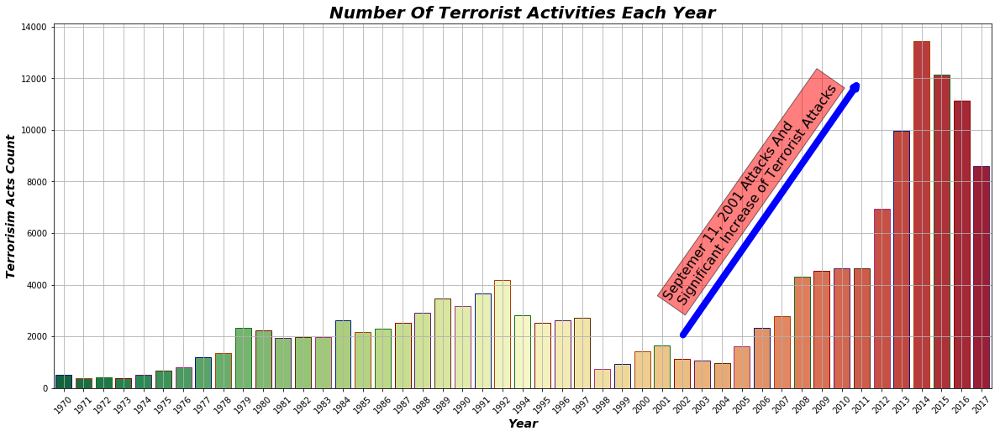

In [18]:
# Number Of Terrorist Activities Each Year
plt.subplots(figsize=(20,8))
sns.countplot('Year',data=df_ReadcsvGTD,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',7))
plt.xticks(rotation=45)
plt.title('Number Of Terrorist Activities Each Year', fontsize=20,style='oblique', fontweight="bold")
plt.xlabel('Year', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Annotate arrow
plt.annotate('',                      # s: str. will leave it blank for no text
             xy=(40, 12000),             # place head of the arrow at point (year 2014 , count 12000)
             xytext=(31, 2000),         # place base of the arrow at point (year 2001 , count 2000)
             xycoords='data',         # will use the coordinate system of the object being annotated 
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=8)
            )

# Annotate Text
txtplt ='Septemer 11, 2001 Attacks And ' + '\n Significant Increase of Terrorist Attacks'
plt.annotate(txtplt, # text to display
             xy=(30, 3000),                 # start the text at at point (year 2008 , pop 30)
             rotation=55,                   # based on trial and error to match the arrow
             va='bottom',                   # want the text to be vertically 'bottom' aligned
             ha='left',                     # want the text to be horizontally 'left' algned.
             fontsize=16,
             bbox=dict(facecolor='red', alpha=0.5)
             )

# Show/Save Plot
plt.savefig('Plt (1) Number Of Terrorist Activities Each Year.png')
plt.show()

# 2- Attacking Methods by Terrorists & Favorite Targets

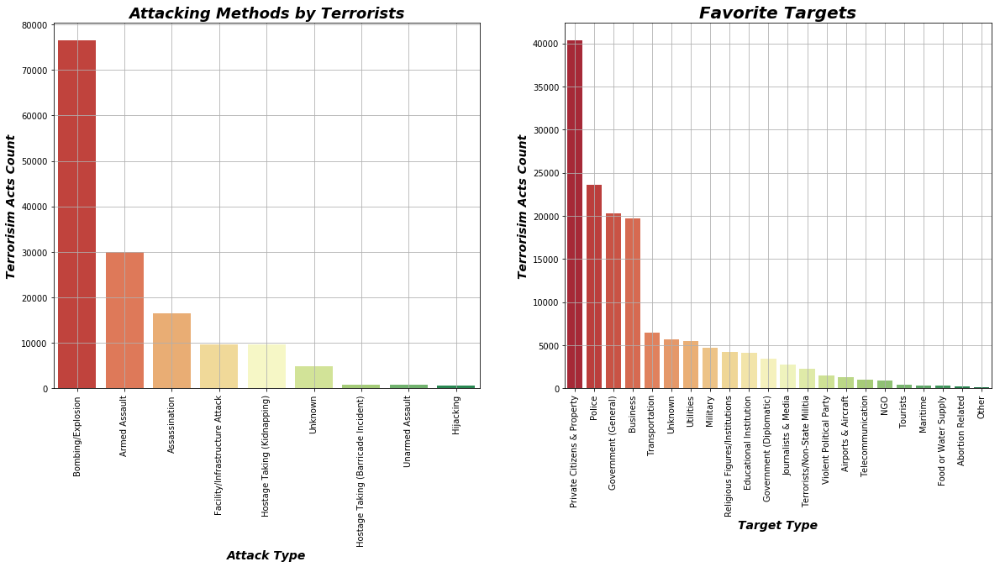

In [19]:
fig = plt.figure(figsize = (20,8))

# Attacking Methods by Terrorists Plot
plt.subplot(1, 2, 1)
sns.countplot('AttackType',data=df_ReadcsvGTD,palette='RdYlGn',order=df_ReadcsvGTD['AttackType'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Attacking Methods by Terrorists', fontsize=18,style='oblique', fontweight="bold")
plt.xlabel('Attack Type', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Favorite Targets Plot
plt.subplot(1, 2, 2)
sns.countplot(df_ReadcsvGTD['TargetType'],palette='RdYlGn',order=df_ReadcsvGTD['TargetType'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Favorite Targets', fontsize=20,style='oblique', fontweight="bold")
plt.xlabel('Target Type', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Show/Save Plot
plt.savefig('Plt (2,3) Attacking Methods by Terrorists & Favorite Targets.png')
plt.show()

#### 3- Number Of Terrorist Activities By Region

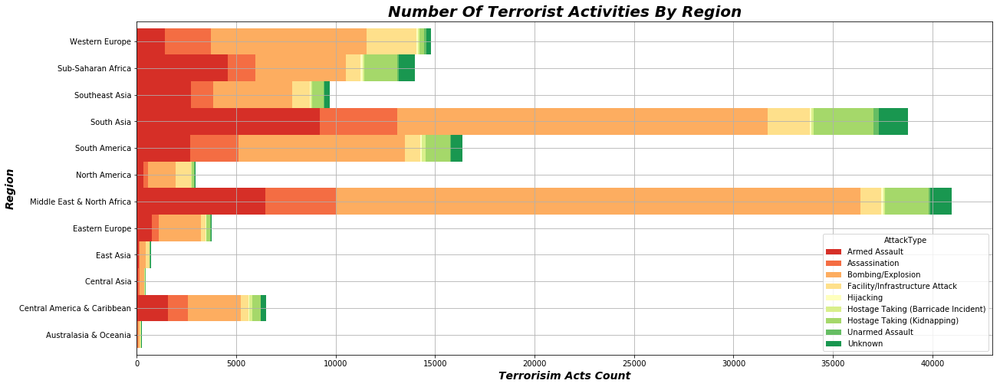

In [20]:
# Number Of Terrorist Activities By Region Plot
pd.crosstab(df_ReadcsvGTD.Region,df_ReadcsvGTD.AttackType).plot.barh(stacked=True,width=1,color=sns.color_palette('RdYlGn',9))
fig=plt.gcf()
fig.set_size_inches(20,8)
plt.title('Number Of Terrorist Activities By Region', fontsize=20,style='oblique', fontweight="bold")
plt.xlabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Region', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Show/Save Plot
plt.savefig('Plt (4) Number Of Terrorist Activities By Region.png')
plt.show()

#### 4- Trend in Terrorist Activities

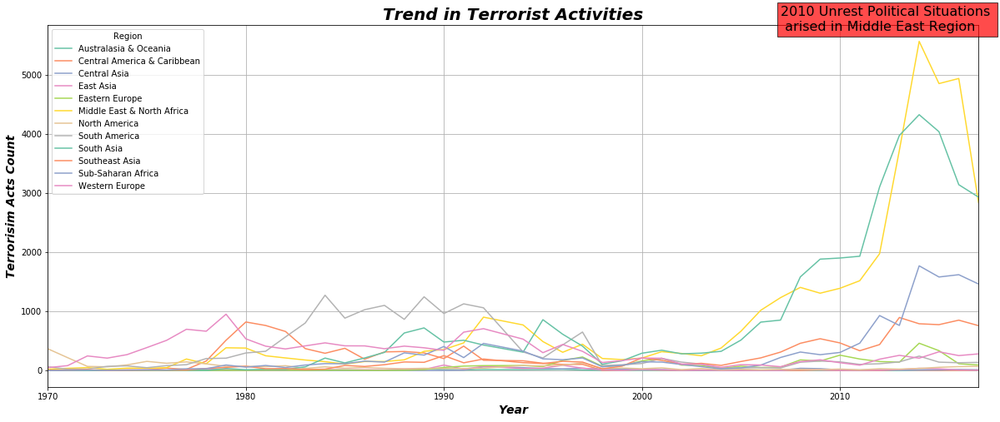

In [21]:
# Number Of Terrorist Activities By Region Plot
pd.crosstab(df_ReadcsvGTD.Year,df_ReadcsvGTD.Region).plot(color=sns.color_palette('Set2',12))
fig=plt.gcf()
fig.set_size_inches(20,8)
plt.title('Trend in Terrorist Activities', fontsize=20,style='oblique', fontweight="bold")
plt.xlabel('Year', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Annotate Graph
txtplt ='2010 Unrest Political Situations ' + '\n arised in Middle East Region'
plt.text(2007, 5750, txtplt, fontsize=16, bbox=dict(facecolor='red', alpha=0.7))

# Show/Save Plot
plt.savefig('Plt (5) Trend in Terrorist Activities.png')
plt.show()

#### 5- Data Distribution Using BoxPlot

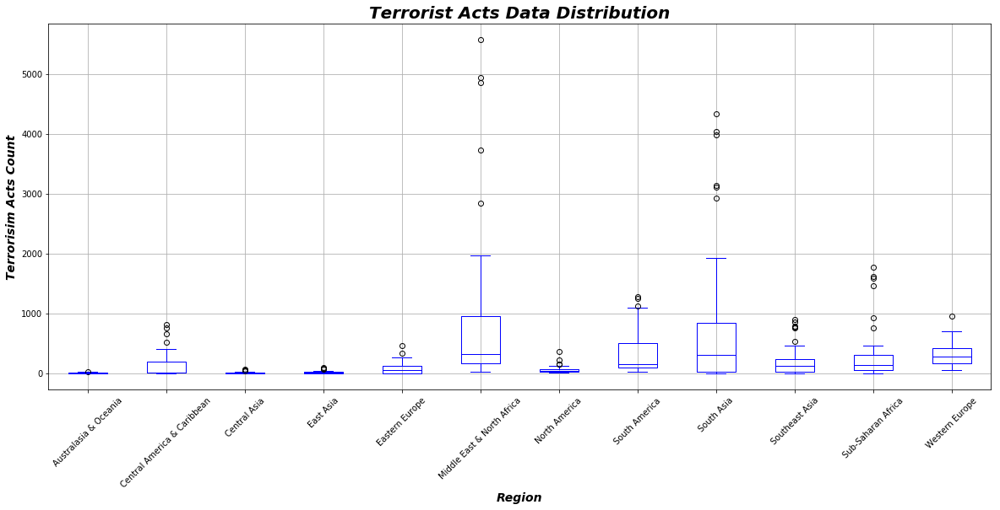

In [22]:
# Data Adjustment for BoxPlot
df_BoxPlot = pd.crosstab(df_ReadcsvGTD.Region,df_ReadcsvGTD.Year)
df_BoxPlot=df_BoxPlot.transpose()

# Draw BoxPlot
df_BoxPlot.plot(kind='box', figsize=(20, 8), color='blue')
plt.title('Terrorist Acts Data Distribution', fontsize=20,style='oblique', fontweight="bold")
plt.xticks(rotation=45)
plt.xlabel('Region', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Show/Save Plot
plt.savefig('Plt (6) Terrorist Acts Data Distribution.png')
plt.show()

#### 6- Countries with Highiest Terrorist Attacks

In [23]:
# Data Adjustment for WordPlot
df_WordPlot = pd.crosstab(df_ReadcsvGTD.Country,df_ReadcsvGTD.Year)
df_WordPlot.reset_index(inplace = True)
df_WordPlot['Total'] = df_WordPlot[list(df_WordPlot.columns)].sum(axis=1)
TotRec = df_WordPlot['Total'].sum()

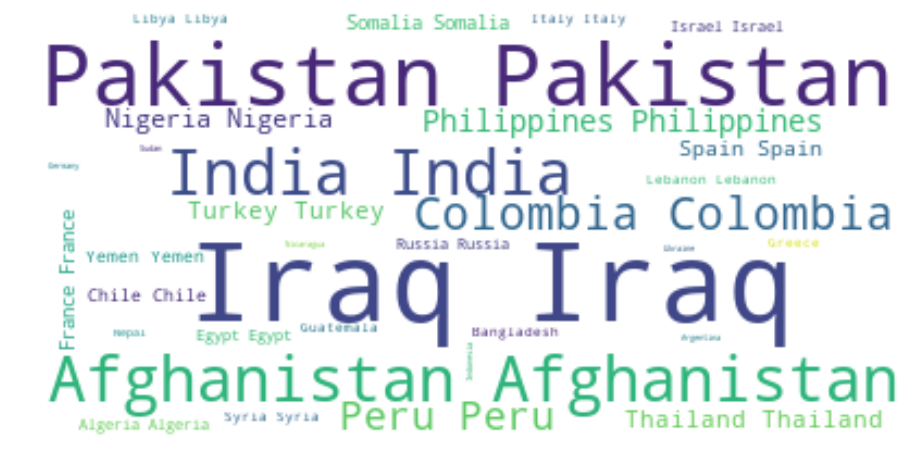

In [24]:
# Build the WorldCloud
max_words = 500
word_string = ''
for country in df_WordPlot['Country']:
    # check if country's name is a single-word name
    if len(country.split(' ')) == 1:
        repeat_num_times = int(df_WordPlot.loc[df_WordPlot['Country'] == country]['Total'].values[0]
                               /float(TotRec)*max_words)
        word_string = word_string + ((country + ' ') * repeat_num_times)
# create the word cloud
wordcloud = WordCloud(background_color='white').generate(word_string)

# display the cloud
fig = plt.figure()
fig.set_figwidth(20)
fig.set_figheight(8)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# Show/Save Plot
plt.savefig('Plt (7) Countries with Highiest Terrorist Attacks.png')
plt.show()

#### 7- Locations of Terrorist Attacks

In [25]:
# Get subset
df_WorldGTD = df_ReadcsvGTD[['Latitude', 'Longitude', 'Summary', 'AttackType', 'Year', 'Region','NumKill','Numwounded']]
regions = list(set(df_WorldGTD.Region))

colors = ['yellow', 'red', 'lightblue', 'purple', 'green', 'orange', 'brown',\
          'aqua', 'lightpink', 'blue', 'gray', 'navy']

In [26]:
def pltpoints(region, color = None, label = None):
    x, y = m(list(df_WorldGTD.Longitude[df_WorldGTD.Region == region].astype("float")),\
            (list(df_WorldGTD.Latitude[df_WorldGTD.Region == region].astype("float"))))
    points = m.plot(x, y, "o", markersize = 2, color = color, label = label, alpha = .5)
    return(points)

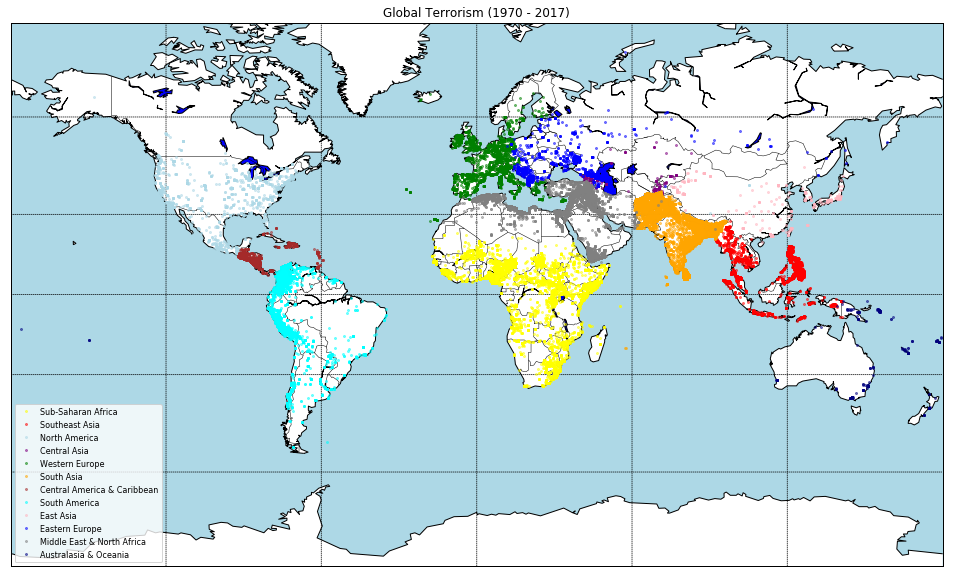

In [27]:
plt.figure(figsize=(20,10))
m = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
m.drawcoastlines()
m.drawcountries()
m.fillcontinents(color='white',lake_color='blue', zorder = 1)
m.drawmapboundary(fill_color='lightblue')
m.drawparallels(np.arange(-90.,91.,30.))
m.drawmeridians(np.arange(-180.,181.,60.))
for i, region in enumerate(regions):
    pltpoints(region, color = colors[i], label = region)  
plt.title("Global Terrorism (1970 - 2017)")
plt.legend(loc ='lower left', prop= {'size':8})
# Show/Save Plot
plt.savefig('Plt (8) Global Terrorism (1970 - 2017).png')
plt.show()

#### 8- Terrorist Attacks by Location (Animated)

In [28]:
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Animation Of Terrorist Activities'+'\n'+'Year:' +str(Year))
    m6 = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    lat6=list(df_WorldGTD[df_WorldGTD['Year']==Year].Latitude)
    long6=list(df_WorldGTD[df_WorldGTD['Year']==Year].Longitude)
    x6,y6=m6(long6,lat6)
    m6.drawcoastlines()
    m6.fillcontinents(zorder = 1,alpha=0.4)
    m6.drawmapboundary(fill_color='lightblue')
    m6.drawparallels(np.arange(-90.,91.,30.))
    m6.drawmeridians(np.arange(-180.,181.,60.))
    m6.drawcountries()
    m6.scatter(x6, y6,s=[(kill+wound)*0.5 for kill,wound in zip(
        df_WorldGTD[df_WorldGTD['Year']==Year].NumKill,
        df_WorldGTD[df_WorldGTD['Year']==Year].Numwounded)],color = 'r')
clear_output()

C:\Users\ahmed.reda\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning:


Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



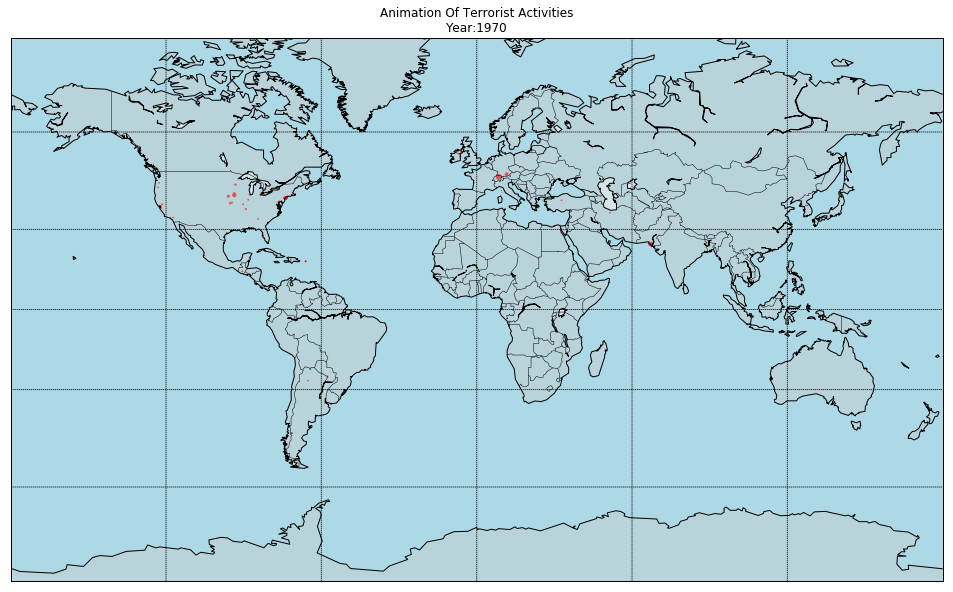

In [29]:
fig = plt.figure(figsize = (20,10))
ani = animation.FuncAnimation(fig,animate,list(df_WorldGTD.Year.unique()), interval = 750)    
ani.save('Plt (9) Terrorist Attacks by Location (Animated).gif', writer='imagemagick', fps=1)
clear_output()


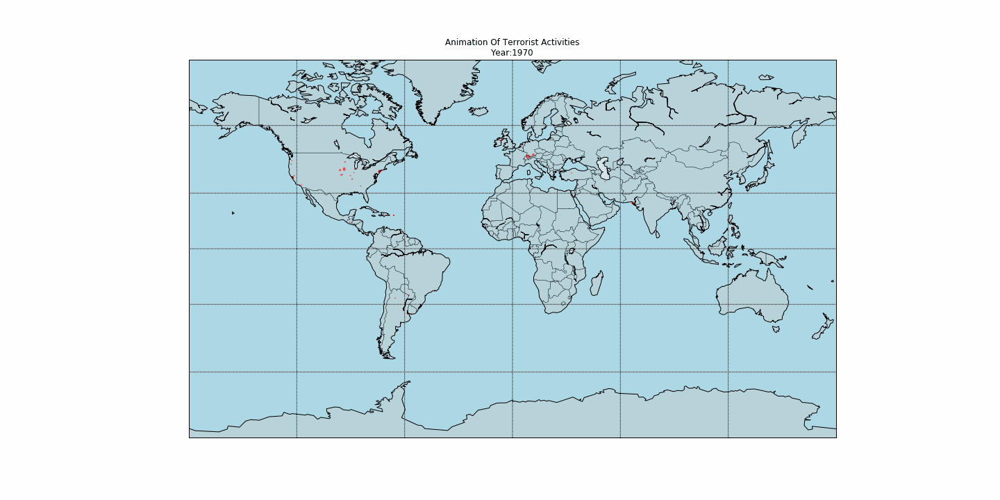

In [30]:
filename = 'Plt (9) Terrorist Attacks by Location (Animated).gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

### Select Subset of Data for analysis

The Selected Area of Intrest will be Middle East & North Africa as per the previous analysis, it is the region with highest attacks and political unrest for the past 10 years

In [31]:
# Create Copy
df_GTD = df_ReadcsvGTD.copy()

# Select Subset of Data
df_SubGTD = df_GTD[df_GTD['Year'] > 2007]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Region == 'Middle East & North Africa')]

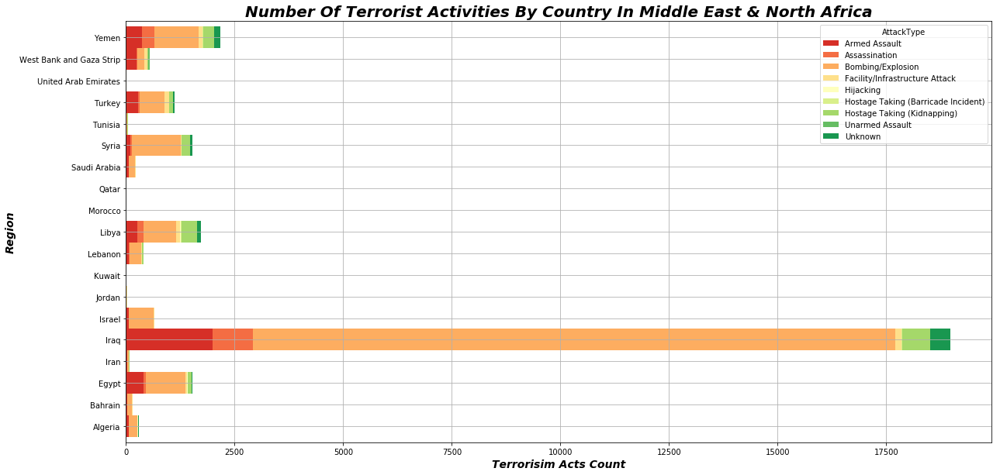

In [32]:
# Number Of Terrorist Activities By Country In Middle East & North Africa
pd.crosstab(df_SubGTD.Country,df_ReadcsvGTD.AttackType).plot.barh(stacked=True,width=1,color=sns.color_palette('RdYlGn',9))
fig=plt.gcf()
fig.set_size_inches(20,10)
plt.title('Number Of Terrorist Activities By Country In Middle East & North Africa', 
          fontsize=20,style='oblique', fontweight="bold")
plt.xlabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Region', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Show/Save Plot
plt.savefig('Plt (10) Number Of Terrorist Activities By Country In Middle East & North Africa.png')
plt.show()

In [33]:
# Select Subset of Data
df_SubGTD = df_SubGTD.loc[(df_SubGTD.AttackType != 'Unknown')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.AttackType != 'Unarmed Assault')]
# Focus on Middle East Countries & ignore IRAQ & Yemen as war zones
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'Iraq')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'Yemen')]
# Ignore these countries for low rates
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'Western Sahara')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'United Arab Emirates')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'Tunisia')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'Qatar')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'Morocco')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'Kuwait')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'Iran')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'International')]
df_SubGTD = df_SubGTD.loc[(df_SubGTD.Country != 'Bahrain')]
# Show number of records
print("No. of Records & columns :: ")
print (df_SubGTD.shape)

No. of Records & columns :: 
(7799, 54)


In [34]:
# Check Numeric Fields
df_SubGTD.describe(include=[np.number]).transpose()

,count,mean,std,min,25%,50%,75%,max
index,7799.0,1.403082e+05,2.427188e+04,8.536300e+04,1.230605e+05,1.438920e+05,1.594325e+05,1.816340e+05
EventID,7799.0,2.014257e+11,2.135971e+08,2.008010e+11,2.013110e+11,2.015020e+11,2.016023e+11,2.017123e+11
Year,7799.0,2.014190e+03,2.137202e+00,2.008000e+03,2.013000e+03,2.015000e+03,2.016000e+03,2.017000e+03
Month,7799.0,6.499423e+00,3.269775e+00,1.000000e+00,4.000000e+00,7.000000e+00,9.000000e+00,1.200000e+01
Day,7799.0,1.577689e+01,8.773443e+00,0.000000e+00,8.000000e+00,1.600000e+01,2.300000e+01,3.100000e+01
CountryID,7799.0,1.316099e+02,5.972118e+01,6.000000e+00,9.700000e+01,1.130000e+02,2.000000e+02,2.090000e+02
RegionID,7799.0,1.000000e+01,0.000000e+00,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01
Latitude,7799.0,3.306076e+01,3.590261e+00,1.645144e+01,3.121223e+01,3.231156e+01,3.591176e+01,4.141061e+01
Longitude,7799.0,3.117474e+01,9.777789e+00,-8.145182e+00,2.868986e+01,3.457515e+01,3.670465e+01,5.075461e+01
ConnectedActs,7799.0,2.029747e-01,4.022397e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00


In [35]:
# Check Object Fields
df_SubGTD.describe(include=[np.object]).transpose()

,count,unique,top,freq
Country,7799,10,Libya,1632
Region,7799,1,Middle East & North Africa,7799
State,7799,218,North Sinai,861
City,7791,1566,Benghazi,568
location,3058,2592,The incident occurred in the Eshkol regional c...,17
Summary,7799,7595,03/13/2016: Assailants raided a house in Wadi ...,13
AttackType,7799,7,Bombing/Explosion,4700
TargetType,7799,21,Private Citizens & Property,2684
TargetSubType,7096,101,Village/City/Town/Suburb,863
TargetCategory,7402,1763,Unknown,1478


In [36]:
# Save DF to CSV
df_SubGTD.reset_index(inplace = True)
df_SubGTD.to_csv('df-Output (2) clean_df_SubGTD.csv')

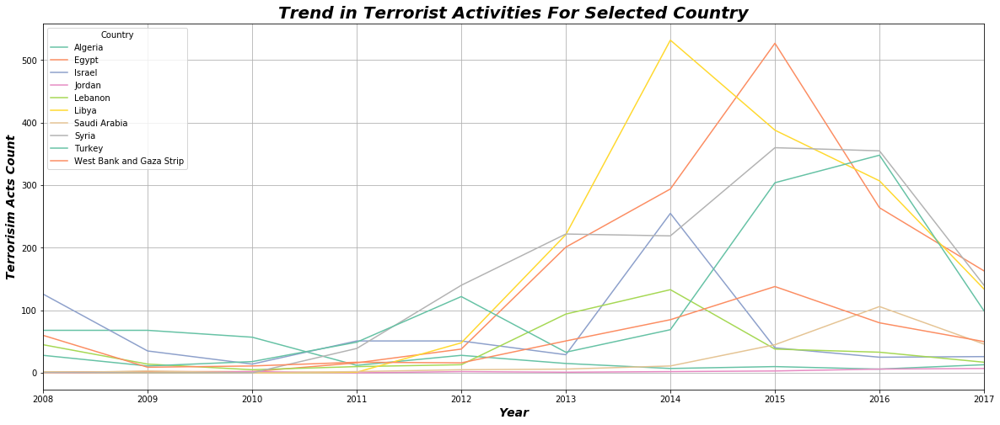

In [37]:
# Number Of Terrorist Activities For Selected Country Plot
pd.crosstab(df_SubGTD.Year,df_SubGTD.Country).plot(color=sns.color_palette('Set2',12))
fig=plt.gcf()
fig.set_size_inches(20,8)
plt.title('Trend in Terrorist Activities For Selected Country', fontsize=20,style='oblique', fontweight="bold")
plt.xlabel('Year', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Show/Save Plot
plt.savefig('Plt (11) Trend in Terrorist Activities For Selected Country.png')
plt.show()

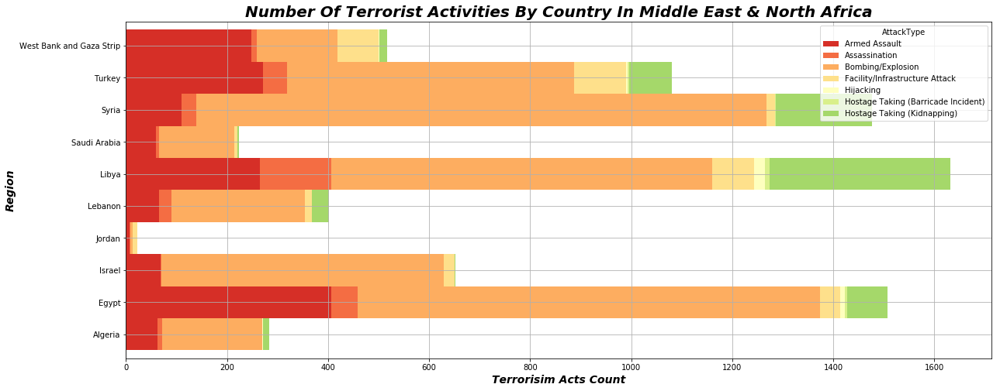

In [38]:
# Number Of Terrorist Activities By Country In Middle East & North Africa
pd.crosstab(df_SubGTD.Country,df_SubGTD.AttackType).plot.barh(stacked=True,width=1,color=sns.color_palette('RdYlGn',9))
fig=plt.gcf()
fig.set_size_inches(20,8)
plt.title('Number Of Terrorist Activities By Country In Middle East & North Africa', 
          fontsize=20,style='oblique', fontweight="bold")
plt.xlabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Region', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Show/Save Plot
plt.savefig('Plt (12) Number Of Terrorist Activities By Country In Middle East & North Africa.png')
plt.show()

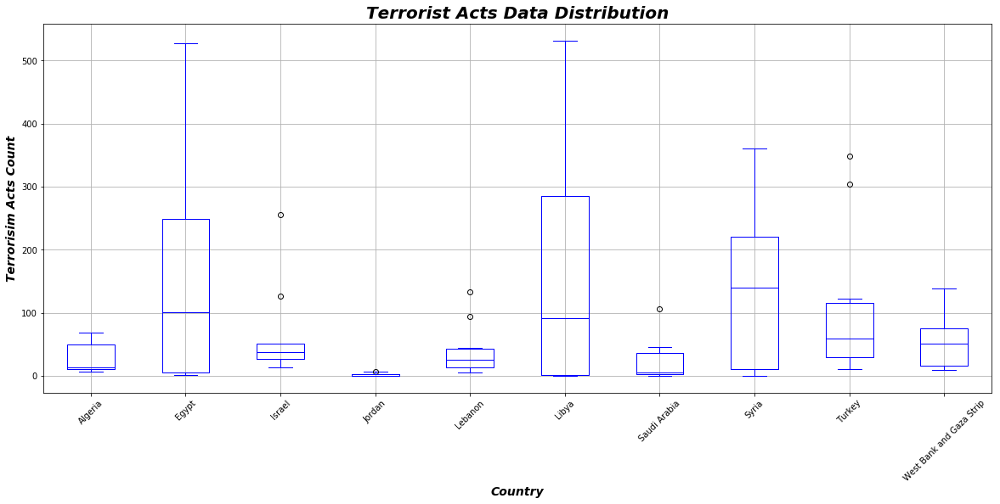

In [39]:
# Data Adjustment for BoxPlot
df_BoxPlot = pd.crosstab(df_SubGTD.Country,df_SubGTD.Year)
df_BoxPlot=df_BoxPlot.transpose()

# Draw BoxPlot
df_BoxPlot.plot(kind='box', figsize=(20, 8), color='blue')
plt.title('Terrorist Acts Data Distribution', fontsize=20,style='oblique', fontweight="bold")
plt.xticks(rotation=45)
plt.xlabel('Country', fontsize=14,style='oblique', fontweight="bold")
plt.ylabel('Terrorisim Acts Count', fontsize=14,style='oblique', fontweight="bold")
plt.grid()

# Show/Save Plot
plt.savefig('Plt (13) Terrorist Acts Data Distribution.png')
plt.show()

GIS Visualization for the data

In [40]:
if os.path.isfile('map_SubGTD.html'):
    print ("File exists and is readable")
else:
    # create map using latitude and longitude values
    #g= geocoder.arcgis('Cairo, Cairo')
    map_GTD = folium.Map(location=[30.0444, 31.2357], zoom_start=5)
    # Set Point Color based on attack type
    #AttackType
    # add markers to the map
    for lat, lng, label in zip(df_SubGTD['Latitude'], df_SubGTD['Longitude'], df_SubGTD['Summary']):
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=2,
            popup=label,        
            fill=True,
            fill_color='red',
            fill_opacity=0.5,
            parse_html=False).add_to(map_GTD)
    # Save it as html
    map_GTD.save('map_SubGTD.html')

File exists and is readable


In [41]:
if os.path.isfile('Heatmap_SubGTD.html'):
    print ("File exists and is readable")
else:
    # create map using latitude and longitude values
    #g= geocoder.arcgis('Cairo, Cairo')
    map_GTD = folium.Map(location=[30.0444, 31.2357], zoom_start=5)
    heat_df = df_SubGTD[['Latitude', 'Longitude']]
    heat_df = heat_df.dropna(axis=0, subset=['Latitude','Longitude'])
    heat_data = [[row['Latitude'],row['Longitude']] for index, row in heat_df.iterrows()]
    #HeatMap(heat_data).add_to(map_GTD)
    HeatMap(heat_data, name=None, min_opacity=.6, max_zoom=18, max_val=0.5, 
            radius=15, blur=15, gradient=None, overlay=True).add_to(map_GTD)
    map_GTD.save('Heatmap_SubGTD.html')

File exists and is readable


In [42]:
%%html
<iframe src="map_SubGTD.html"width="475" height="350"></iframe>
<iframe src="Heatmap_SubGTD.html" width="475" height="350"></iframe>

<hr style="border: dashed rgb(0,0,0) 1.0px;background-color: rgb(0,0,0);height: 1.0px;"/>

<a id="item2"></a>
<h2 id="item2">2- Exploratary Analysis for Data to check for patterns & Trends </h2>

#### Check Trends in Selected Countries

In [43]:
def CreatePlot(df_Plt, Xcol, YCol):
    # Data Adjustment for Scatter Plot
    df_SctPlt = df_Plt.loc[(df_Plt.Country == YCol)]
    df_SctPlt.reset_index(inplace = True)
    df_SctPlt = pd.crosstab(df_SctPlt.Country, df_SctPlt.Year)
    df_SctPlt=df_SctPlt.transpose()
    df_SctPlt.reset_index(inplace = True)
    # Fit
    x = df_SctPlt[Xcol]      # year on x-axis
    y = df_SctPlt[YCol]     # total on y-axis
    fit = np.polyfit(x, y, deg=1)
    fit
    # Start Plotting
    df_SctPlt.plot(kind='scatter', x=Xcol, y=YCol, figsize=(6, 4), color='darkblue')
    plt.title('Terrorisim Acts in ' + YCol + ' from 1970-2017', fontsize=12,style='oblique', fontweight="bold")
    plt.xlabel(Xcol, fontsize=10,style='oblique', fontweight="bold")
    plt.ylabel('Terrorisim Acts Count', fontsize=10,style='oblique', fontweight="bold")
    plt.grid()
    # plot line of best fit
    plt.plot(x, fit[0] * x + fit[1], color='red') # recall that x is the Years
    # Show/Save Plot
    plt.savefig('Plt (14-' + YCol + ') Terrorist Acts Data Distribution.png')
    # plt.show()
    plt.close
    plt.clf()
    clear_output()

In [44]:
# Check Egypt
CreatePlot(df_ReadcsvGTD, 'Year', 'Egypt')

# Check Libya
CreatePlot(df_ReadcsvGTD, 'Year', 'Libya')

# Check Israel
CreatePlot(df_ReadcsvGTD, 'Year', 'Israel')

# Check West Bank and Gaza Strip
CreatePlot(df_ReadcsvGTD, 'Year', 'West Bank and Gaza Strip')

# Check Syria
CreatePlot(df_ReadcsvGTD, 'Year', 'Syria')

# Check Turkey
CreatePlot(df_ReadcsvGTD, 'Year', 'Turkey')

clear_output()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [45]:
## Read images from file (because this is binary, maybe you can find how to use ByteIO) but this is more easy
import IPython.display as display
img1 = open('Plt (14-Egypt) Terrorist Acts Data Distribution.png', 'rb').read()
img2 = open('Plt (14-Libya) Terrorist Acts Data Distribution.png', 'rb').read()
img3 = open('Plt (14-Israel) Terrorist Acts Data Distribution.png', 'rb').read()
img4 = open('Plt (14-West Bank and Gaza Strip) Terrorist Acts Data Distribution.png', 'rb').read()
img5 = open('Plt (14-Syria) Terrorist Acts Data Distribution.png', 'rb').read()
img6 = open('Plt (14-Turkey) Terrorist Acts Data Distribution.png', 'rb').read()
## Create image widgets. You can use layout of ipywidgets only with widgets.
## Set image variable, image format and dimension.
wi1 = widgets.Image(value=img1, format='png', width=400, height=500)
wi2 = widgets.Image(value=img2, format='png', width=400, height=400)
wi3 = widgets.Image(value=img3, format='png', width=400, height=400)
wi4 = widgets.Image(value=img4, format='png', width=400, height=400)
wi5 = widgets.Image(value=img5, format='png', width=400, height=400)
wi6 = widgets.Image(value=img6, format='png', width=400, height=400)
## Side by side thanks to HBox widgets
sidebyside = widgets.HBox([wi1, wi2, wi3])
sidebyside1 = widgets.HBox([wi4, wi5, wi6])
## Finally, show.
display.display(sidebyside,sidebyside1)

<p3>Pearson Correlation</p>
<p>The Pearson Correlation measures the linear dependence between two variables X and Y.</p>
<p>The resulting coefficient is a value between -1 and 1 inclusive, where:</p>
<ul>
    <li><b>1</b>: Total positive linear correlation.</li>
    <li><b>0</b>: No linear correlation, the two variables most likely do not affect each other.</li>
    <li><b>-1</b>: Total negative linear correlation.</li>
</ul>

In [46]:
df_SubGTD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7799 entries, 0 to 7798
Data columns (total 55 columns):
level_0               7799 non-null int64
index                 7799 non-null int64
EventID               7799 non-null int64
Year                  7799 non-null int32
Month                 7799 non-null int32
Day                   7799 non-null int32
CountryID             7799 non-null int64
Country               7799 non-null object
RegionID              7799 non-null int64
Region                7799 non-null object
State                 7799 non-null object
City                  7791 non-null object
Latitude              7799 non-null float64
Longitude             7799 non-null float64
location              3058 non-null object
Summary               7799 non-null object
ConnectedActs         7799 non-null float64
SuccessAct            7799 non-null int64
SuicideAct            7799 non-null int64
AttackID              7799 non-null int64
AttackType            7799 non-null objec

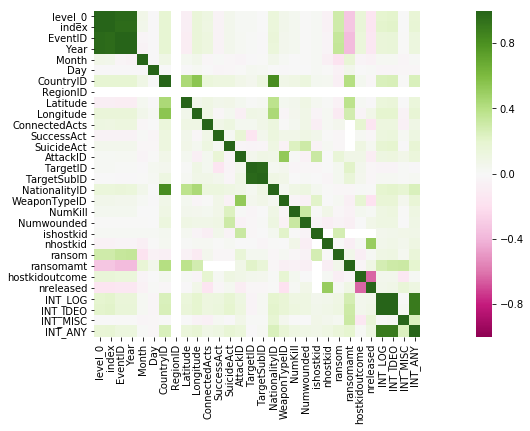

In [47]:
# measure of the extent of interdependence between variables.
corrmat = df_SubGTD.corr() 
f, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(corrmat, cmap="PiYG", vmin=-1, vmax=1, square=True);
# Show/Save Plot
plt.savefig('Plt (15) Correlation between between variables.png')
plt.show()

In [48]:
# calculate the correlation between Selected variables
df_SubGTD[['CountryID', 'ConnectedActs', 'SuccessAct', 'SuicideAct', 'AttackID', 'TargetID', 'TargetSubID', 
           'WeaponTypeID', 'ishostkid']].corr() 

,CountryID,ConnectedActs,SuccessAct,SuicideAct,AttackID,TargetID,TargetSubID,WeaponTypeID,ishostkid
CountryID,1.000000,0.147697,0.123949,0.118984,0.075246,0.047650,0.109934,0.084676,0.039960
ConnectedActs,0.147697,1.000000,0.081363,0.109495,0.042253,0.046394,0.080894,0.004713,-0.076937
SuccessAct,0.123949,0.081363,1.000000,0.028746,0.166262,-0.157455,0.056459,0.070404,0.069356
SuicideAct,0.118984,0.109495,0.028746,1.000000,-0.025184,-0.034424,-0.028172,-0.047390,-0.040349
AttackID,0.075246,0.042253,0.166262,-0.025184,1.000000,0.058001,0.086419,0.527575,0.327527
TargetID,0.047650,0.046394,-0.157455,-0.034424,0.058001,1.000000,0.979062,0.048351,-0.021757
TargetSubID,0.109934,0.080894,0.056459,-0.028172,0.086419,0.979062,1.000000,0.071021,-0.000727
WeaponTypeID,0.084676,0.004713,0.070404,-0.047390,0.527575,0.048351,0.071021,1.000000,0.217022
ishostkid,0.039960,-0.076937,0.069356,-0.040349,0.327527,-0.021757,-0.000727,0.217022,1.000000


There are some obvious correlations, between country, Connected Acts, Success Acts, Suicide Acts & Attacks Type. Otherwise variables are fairly non-correlated. It's obvious that the existing correlation between rest of variables is week

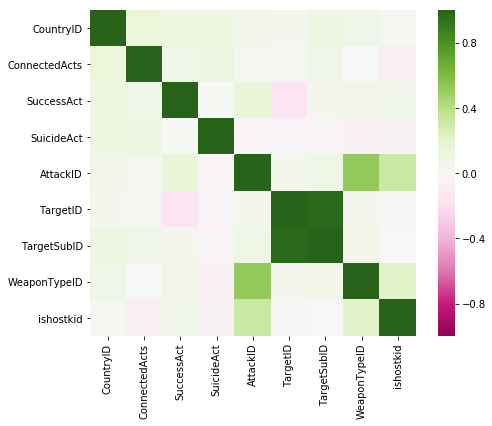

In [49]:
corrmat = df_SubGTD[['CountryID', 'ConnectedActs', 'SuccessAct', 'SuicideAct', 'AttackID', 'TargetID', 'TargetSubID', 
           'WeaponTypeID' ,'ishostkid']].corr() 
f, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(corrmat, cmap="PiYG", vmin=-1, vmax=1, square=True);
# Show/Save Plot
plt.savefig('Plt (16) Correlation between between Selected variables.png')
plt.show()

<hr style="border: dashed rgb(0,0,0) 1.0px;background-color: rgb(0,0,0);height: 1.0px;"/>

<a id="item3"></a>
<h2 id="item3">3- Model Development, Evaluation and Refinement</h2>

Now we need to split our data to a train set (80%) and test set (20%). The variable we're trying to predict is Connected Acts; what determines whether a terrorist attack will be Connected or not.

In [50]:
#Provide Info about the existing fields in Dataset
print("No. of columns not containing null values :: ")
print(len(df_SubGTD.columns[df_SubGTD.notna().all()]))
if len(df_SubGTD.columns[df_SubGTD.notna().all()])> 0: 
    print(df_SubGTD.columns[df_SubGTD.notna().all()])

print("No. of columns containing null values")
print(len(df_SubGTD.columns[df_SubGTD.isna().any()]))
if len(df_SubGTD.columns[df_SubGTD.isna().any()]) > 0:
    print(df_SubGTD.columns[df_SubGTD.isna().any()])

No. of columns not containing null values :: 
32
Index(['level_0', 'index', 'EventID', 'Year', 'Month', 'Day', 'CountryID',
       'Country', 'RegionID', 'Region', 'State', 'Latitude', 'Longitude',
       'Summary', 'ConnectedActs', 'SuccessAct', 'SuicideAct', 'AttackID',
       'AttackType', 'TargetID', 'TargetType', 'AttackerName', 'WeaponTypeID',
       'WeaponType', 'NumKill', 'Numwounded', 'ishostkid', 'dbsource',
       'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')
No. of columns containing null values
23
Index(['City', 'location', 'TargetSubID', 'TargetSubType', 'TargetCategory',
       'TargetName', 'NationalityID', 'Nationality', 'Motive', 'WeaponDetail',
       'nhostkid', 'divert', 'kidhijcountry', 'ransom', 'ransomamt',
       'hostkidoutcome', 'hostkidoutcome_txt', 'nreleased', 'addnotes',
       'scite1', 'scite2', 'scite3', 'related'],
      dtype='object')


In [51]:
# Remove the columns which don't containing numeric values.
X=df_SubGTD.copy()
columns = ['Country', 'Region', 'State','City', 'location', 'Summary', 'AttackType','TargetType','TargetSubType',
           'TargetCategory','TargetName','Nationality','AttackerName','Motive','WeaponType','WeaponDetail','divert',
           'kidhijcountry','hostkidoutcome_txt','addnotes','scite1','scite2','scite3','dbsource','related','ConnectedActs',
          'nhostkid','ransom','ransomamt','hostkidoutcome','nreleased','TargetSubID','NationalityID', 'level_0', 'index',
          'EventID', 'Month', 'Day','RegionID','Latitude','Longitude','INT_LOG','INT_IDEO','INT_MISC','INT_ANY']
X.drop(columns, inplace=True, axis=1)
# Y
y=df_SubGTD['ConnectedActs']
# Show number of records
print("No. of Records & columns :: ")
print (X.shape)

No. of Records & columns :: 
(7799, 10)


In [52]:
X.head()
#Provide Info about the existing fields in Dataset
print("No. of columns not containing null values :: ")
print(len(X.columns[X.notna().all()]))
if len(X.columns[X.notna().all()])> 0: 
    print(X.columns[X.notna().all()])

print("No. of columns containing null values")
print(len(X.columns[X.isna().any()]))
if len(X.columns[X.isna().any()]) > 0:
    print(X.columns[X.isna().any()])

No. of columns not containing null values :: 
10
Index(['Year', 'CountryID', 'SuccessAct', 'SuicideAct', 'AttackID', 'TargetID',
       'WeaponTypeID', 'NumKill', 'Numwounded', 'ishostkid'],
      dtype='object')
No. of columns containing null values
0


<hr>

<div id="setting_up_tree">
    <h2>Setting up the Decision Tree</h2>
    We will be using <b>train/test split</b> on our <b>decision tree</b>. Let's import <b>train_test_split</b> from <b>sklearn.cross_validation</b>.
</div>

Now <b> train_test_split </b> will return 4 different parameters. We will name them: X_trainset, X_testset, y_trainset, y_testset <br>
The <b> train_test_split </b> will need the parameters: X, y, test_size=0.3, and random_state=3. <br>
The <b>X</b> and <b>y</b> are the arrays required before the split, the <b>test_size</b> represents the ratio of the testing dataset, and the <b>random_state</b> ensures that we obtain the same splits.

In [53]:
X_trainset, X_testset, y_trainset, y_testset = train_test_split(X, y, test_size=0.3, random_state=3)

In [54]:
terrorTree = DecisionTreeClassifier(criterion="entropy", max_depth = 5)
terrorTree # it shows the default parameters
terrorTree.fit(X_trainset,y_trainset)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [55]:
dot_data = StringIO()
filename = "Plt (17) Decision Tree.png"
featureNames = X.columns
targetNames = df_SubGTD['ConnectedActs'].unique().tolist()
out=tree.export_graphviz(terrorTree,feature_names=featureNames, out_file=dot_data, 
                         filled=True, rounded=True, special_characters=True,rotate=False, class_names=['0','1'])  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(400, 400))
# Show Plot
plt.imshow(img,interpolation='nearest')

In [56]:
#Predict the response for test dataset
y_pred = terrorTree.predict(X_testset)

# Model Accuracy, how often is the classifier correct?
if metrics.accuracy_score(y_testset, y_pred) > 0.5:
    print("The resulted accuracy is good, Accuracy:",metrics.accuracy_score(y_testset, y_pred))
else:
    print("The resulted accuracy is low, Accuracy:",metrics.accuracy_score(y_testset, y_pred))
    
# The resulted Classification Report
print("The resulted Classification Report:")
print(classification_report(y_testset,y_pred))

# The resulted Confusion Matrix
print("The resulted Confusion Matrix:")
print(confusion_matrix(y_testset,y_pred))

The resulted accuracy is good, Accuracy: 0.8239316239316239
The resulted Classification Report:
              precision    recall  f1-score   support

         0.0       0.83      0.98      0.90      1874
         1.0       0.70      0.20      0.31       466

   micro avg       0.82      0.82      0.82      2340
   macro avg       0.77      0.59      0.61      2340
weighted avg       0.81      0.82      0.78      2340

The resulted Confusion Matrix:
[[1835   39]
 [ 373   93]]


<hr>

<div id="setting_up_tree">
    <h2>Setting up the SVM</h2>
</div>

In [57]:
clf = svm.SVC(gamma='auto')
clf.fit(X_trainset,y_trainset)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

After being fitted, the model can then be used to predict new values:

In [58]:
yhat = clf.predict(X_testset)
yhat [0:5]

array([0., 0., 0., 0., 0.])

In [59]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [60]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_testset, yhat, labels=[0,1])
np.set_printoptions(precision=2)
print (classification_report(y_testset, yhat))

              precision    recall  f1-score   support

         0.0       0.84      0.97      0.90      1874
         1.0       0.70      0.24      0.36       466

   micro avg       0.83      0.83      0.83      2340
   macro avg       0.77      0.61      0.63      2340
weighted avg       0.81      0.83      0.79      2340



Confusion matrix, without normalization
[[1827   47]
 [ 355  111]]


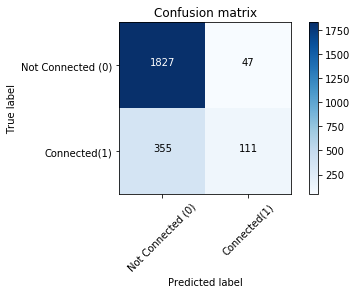

In [61]:
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Not Connected (0)','Connected(1)'],normalize= False,  title='Confusion matrix')

In [62]:
f1_score(y_testset, yhat, average='weighted') 

0.7923298184392858

In [63]:
jaccard_similarity_score(y_testset, yhat)

0.8282051282051283

GIS Visualization for Connected Acts

In [64]:
if os.path.isfile('map_ConSubGTD.html'):
    print ("File exists and is readable")
else:
    # create map using latitude and longitude values
    #g= geocoder.arcgis('Cairo, Cairo')
    map_GTD = folium.Map(location=[30.0444, 31.2357], zoom_start=5)
    # Set Point Color based on Connected Acts
    df_SubGTD= df_SubGTD.loc[(df_SubGTD.ConnectedActs == 1)]
    # add markers to the map
    for lat, lng, label in zip(df_SubGTD['Latitude'], df_SubGTD['Longitude'], df_SubGTD['Summary']):
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=2,
            popup=label,        
            fill=True,
            fill_color= "blue",
            fill_opacity=0.5,
            parse_html=False).add_to(map_GTD)
    # Save it as html
    map_GTD.save('map_ConSubGTD.html')

File exists and is readable


In [65]:
%%html
<iframe src="map_ConSubGTD.html"width="960" height="450"></iframe>

<hr style="border: dashed rgb(0,0,0) 1.0px;background-color: rgb(0,0,255);height: 3.0px;"/>

References Used:

Global Terrorism Trends (Animation) : https://www.kaggle.com/ronaldtroncoso20/global-terrorism-trends-animation

Terrorism Around The World : https://www.kaggle.com/ash316/terrorism-around-the-world 

Decision Trees and Random Forests - Terrorism in Europe 1970-2016 : https://github.com/LJANGN/Predicting-terrorism-in-Europe-through-Decision-Trees-and-Random-Forests/blob/master/decisiontrees_randomforests_gtd_final.ipynb

Copyright &copy; Ahmed Reda 2019.